## Notebook for datasets integration

- **Developed by**: Anna Maguza
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230425

### Import packages

In [1]:
import sys
import scvi
import torch
import anndata
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import numpy as np
import scipy as sp
import pandas as pd
import scanpy as sc
import numpy.random as random


from umap import UMAP
import warnings; warnings.simplefilter('ignore')

import matplotlib.pyplot as plt

from scvi.model.utils import mde 

/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarnin

In [2]:
%matplotlib inline
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

In [3]:
torch.cuda.is_available()

False

In [4]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.1.1
chex                        0.1.6
colorama                    0.4.6
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
entrypoints                 0.4
executing                   0.8.3
flax                        0.6.1
fsspec                      2023.3.0
h5py                        3.8.0
hypergeom_uf

In [5]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

In [6]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### 3000 Highly Variable Genes

### Load Data

In [24]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Initial Datasets/All_cells_3000_HVGs.h5ad'
adata = sc.read(input)
X_is_raw(adata)

True

In [25]:
# Shuffle the data
adata = adata[adata.obs.sample(frac=1).index]

### Integration with scVI

In [26]:
adata = adata.copy()
scvi.model.SCVI.setup_anndata(adata, 
                              layer = "counts", 
                              labels_key = "Cell Type", 
                              categorical_covariate_keys = ["Sample_ID", "Donor_ID"],
                              continuous_covariate_keys = ["n_genes_by_counts", "total_counts"])

In [27]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [28]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 14/14: 100%|██████████| 14/14 [44:25<00:00, 186.69s/it, loss=648, v_num=1]

`Trainer.fit` stopped: `max_epochs=14` reached.


Epoch 14/14: 100%|██████████| 14/14 [44:25<00:00, 190.39s/it, loss=648, v_num=1]


In [29]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

In [34]:
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

Epoch 2/14:   7%|▋         | 1/14 [1:38:57<21:26:25, 5937.38s/it, loss=660, v_num=1]


### Integration with scANVI

In [35]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata,
    labels_key="Cell Type",
    unlabeled_category="Unknown",
)

In [36]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [2:36:17<00:00, 469.58s/it, loss=709, v_num=1]  

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [2:36:17<00:00, 468.88s/it, loss=709, v_num=1]


In [37]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

In [38]:
adata.obsm["X_mde_scanvi"] = mde(adata.obsm["X_scANVI"])

In [39]:
# Save the results
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Integrated datasets/All_cells_3000_HVGs_scvi_scanvi.h5ad')

In [40]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.4, spread = 4, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:48)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:59)


In [42]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 557099 × 3000
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Gender', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels'
    var: 'gene_id-query', 'gene_name-query', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mito', 'ribo', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap'
    obsm: '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI', 'X_mde', 'X_scANVI', 'X_mde_scanvi', 'X_umap'

In [ ]:
sc.pl.umap(adata, frameon = False, color = ['Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Location', 'Age_group', 'Library_Preparation_Protocol', 'Gender', 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ribo'], size = 1, legend_fontsize = 5, ncols = 3)

#### 5000 Highly Variable Genes

### Load Data

In [46]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Initial Datasets/All_cells_5000_HVGs.h5ad'
adata = sc.read(input)
X_is_raw(adata)

True

In [47]:
# Shuffle the data
adata = adata[adata.obs.sample(frac=1).index]

### Integration with scVI

In [48]:
adata = adata.copy()
scvi.model.SCVI.setup_anndata(adata, 
                              layer = "counts", 
                              labels_key = "Cell Type", 
                              categorical_covariate_keys = ["Sample_ID", "Donor_ID"],
                              continuous_covariate_keys = ["n_genes_by_counts", "total_counts"])

In [49]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [50]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 14/14: 100%|██████████| 14/14 [47:47<00:00, 200.84s/it, loss=1.02e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=14` reached.


Epoch 14/14: 100%|██████████| 14/14 [47:47<00:00, 204.84s/it, loss=1.02e+03, v_num=1]


In [51]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

In [52]:
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

### Integration with scANVI

In [53]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata,
    labels_key="Cell Type",
    unlabeled_category="Unknown",
)

In [54]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [2:27:35<00:00, 440.72s/it, loss=1.09e+03, v_num=1]  

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [2:27:35<00:00, 442.80s/it, loss=1.09e+03, v_num=1]


In [55]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

In [56]:
adata.obsm["X_mde_scanvi"] = mde(adata.obsm["X_scANVI"])

In [61]:
# Save the results
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Integrated datasets/All_cells_5000_HVGs_scvi_scanvi.h5ad')

In [58]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.4, spread = 4, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:44)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:38)


In [ ]:
sc.pl.umap(adata, frameon = False, color = ['Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Location', 'Age_group', 'Library_Preparation_Protocol', 'Gender', 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ribo'], size = 1, legend_fontsize = 5, ncols = 3)

#### 7000 Highly Variable Genes

### Load Data

In [62]:
input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Initial Datasets/All_cells_7000_HVGs.h5ad'
adata = sc.read(input)
X_is_raw(adata)

True

In [63]:
# Shuffle the data
adata = adata[adata.obs.sample(frac=1).index]

### Integration with scVI

In [64]:
adata = adata.copy()
scvi.model.SCVI.setup_anndata(adata, 
                              layer = "counts", 
                              labels_key = "Cell Type", 
                              categorical_covariate_keys = ["Sample_ID", "Donor_ID"],
                              continuous_covariate_keys = ["n_genes_by_counts", "total_counts"])

In [65]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [66]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 14/14: 100%|██████████| 14/14 [1:03:26<00:00, 281.89s/it, loss=1.37e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=14` reached.


Epoch 14/14: 100%|██████████| 14/14 [1:03:26<00:00, 271.89s/it, loss=1.37e+03, v_num=1]


In [67]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

In [68]:
adata.obsm["X_mde"] = mde(adata.obsm["X_scVI"])

### Integration with scANVI

In [69]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata,
    labels_key="Cell Type",
    unlabeled_category="Unknown",
)

In [70]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [3:34:04<00:00, 594.53s/it, loss=1.42e+03, v_num=1]  

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [3:34:04<00:00, 642.24s/it, loss=1.42e+03, v_num=1]


In [71]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

In [72]:
adata.obsm["X_mde_scanvi"] = mde(adata.obsm["X_scANVI"])

In [73]:
# Save the results
adata.write('/Users/anna.maguza/Desktop/Data/Processed_datasets/Datasets Integration/Integrated datasets/All_cells_7000_HVGs_scvi_scanvi.h5ad')

In [74]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.4, spread = 4, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:48)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:12:17)


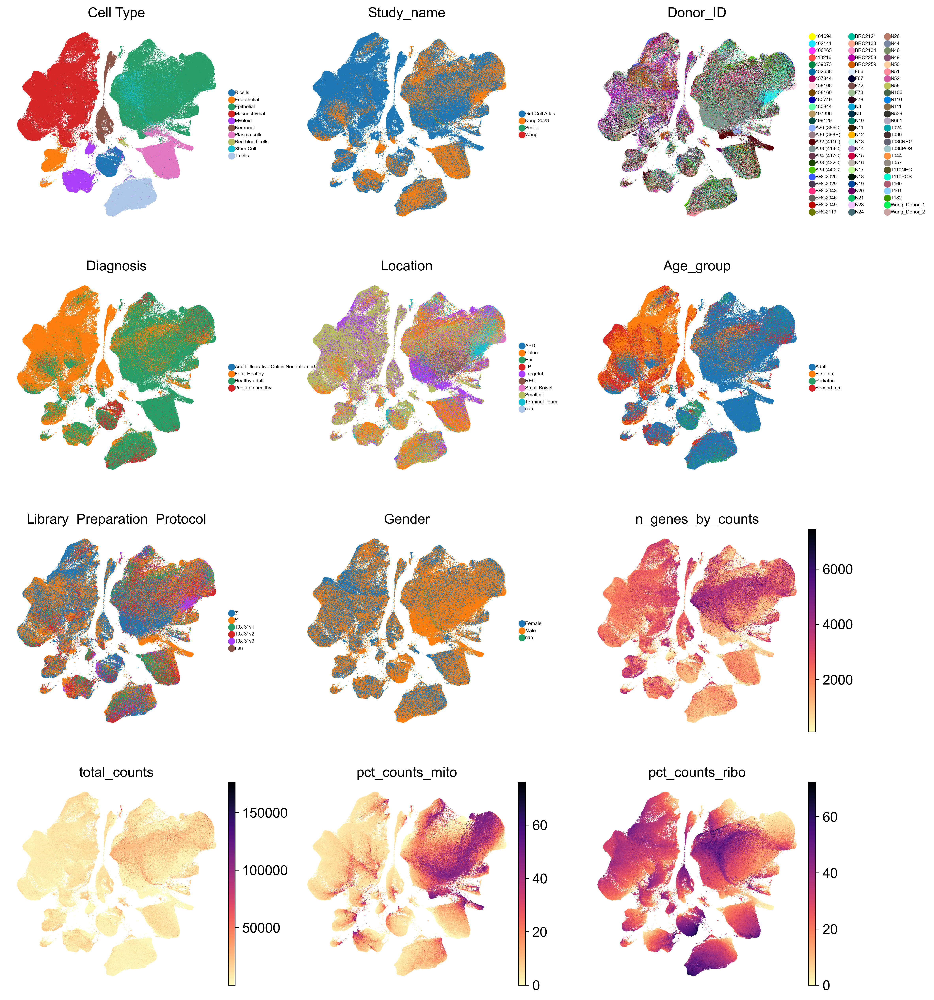

In [75]:
sc.pl.umap(adata, frameon = False, color = ['Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Location', 'Age_group', 'Library_Preparation_Protocol', 'Gender', 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ribo'], size = 1, legend_fontsize = 5, ncols = 3)